# **Análisis exploratorio de los datos**

### **Importación de librerías**

In [1]:
import importlib
import os
import pandas as pd
import sys

import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'tools')))
toolbox = importlib.import_module('toolbox')

### **Cargar dataset**

In [2]:
data = pd.read_csv(os.path.join(os.getcwd(), '..', 'data', 'MET_Limpio.csv'))

Una vez ya se han limpiado y normalizado los datos, se procederá a hacer un análisis exploratorio de los datos (EDA), para ver la relación de todas las columnas del dataset y encontrar la mejor forma de incorporar después un modelo de Machine Learning.  
Sin embargo, antes de nada se hará una división del dataset en "train" y "test", para así no influir en el conjunto de prueba.

In [3]:
# Separar y guardar el dataset en train y test
train_df, test_df = train_test_split(data, test_size = 0.2, random_state = 42, stratify = data['Is Highlight'])

train_df.to_csv(os.path.join(os.getcwd(), '..', 'data', 'train.csv'), index = False)
test_df.to_csv(os.path.join(os.getcwd(), '..', 'data', 'test.csv'), index = False)

### **EDA**

**Descripción general del dataset**

In [4]:
toolbox.describe_df(train_df)

,Is Highlight,Is Timeline Work,Is Public Domain,Title,Artist,Date,Culture,Period,Object Name,Medium,Dimensions,Country,Acquisition Year,Credit Line
Tipos,bool,bool,bool,object,object,int64,object,object,object,object,object,object,int64,object
% Faltante,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Valores Únicos,2,2,2,192423,54418,1728,5966,1641,22968,51644,209317,834,155,29410
% Cardinalidad,0.0,0.0,0.0,59.03,16.69,0.53,1.83,0.5,7.05,15.84,64.21,0.26,0.05,9.02


In [5]:
# Establecer target, columnas categóricas y columnas numéricas
target = 'Is Highlight'

cat_cols = train_df.select_dtypes(include = ['object', 'bool']).columns.tolist()
cat_cols.remove(target)

num_cols = train_df.select_dtypes(include = ['number']).columns.tolist()

**Distribución de la variable objetivo**

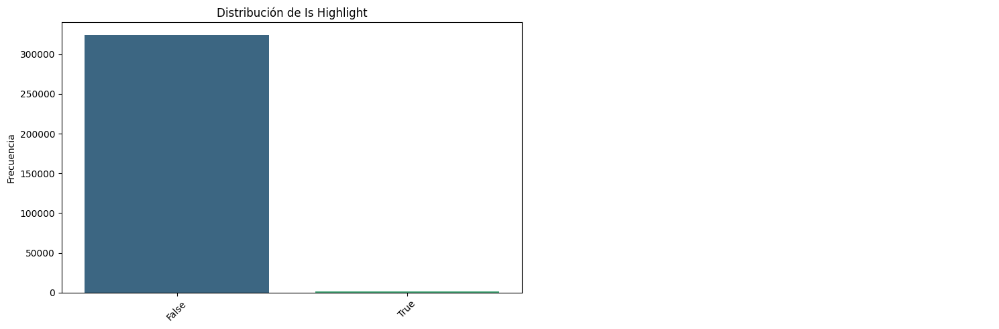

In [6]:
toolbox.plot_categorical_distribution(train_df, [target])

In [7]:
train_df['Is Highlight'].value_counts()

Is Highlight
False    324208
True       1792
Name: count, dtype: int64

**Distribución de las variables categóricas "Is Timeline Work" e "Is Public Domain"**

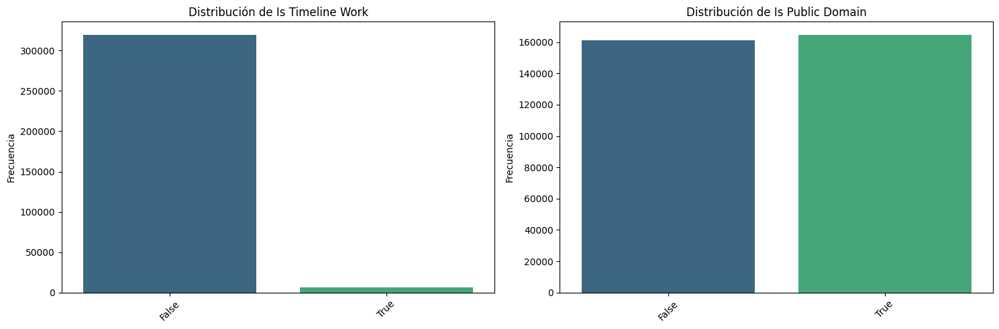

In [8]:
toolbox.plot_categorical_distribution(train_df, ['Is Timeline Work', 'Is Public Domain'])

**Relación entre las variables categóricas "Is Timeline Work" e "Is Public Domain" y el target**

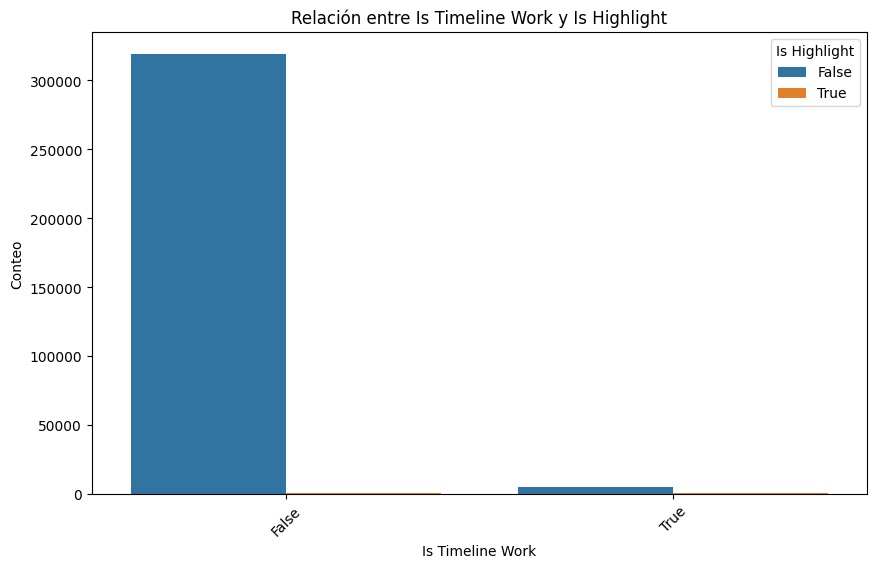

In [9]:
toolbox.plot_categorical_relationship(train_df, 'Is Timeline Work', target)

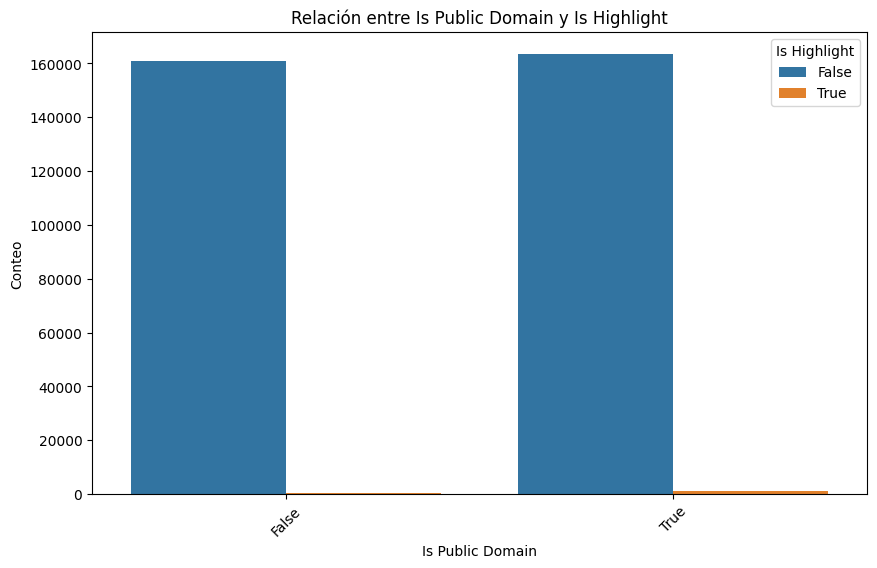

In [10]:
toolbox.plot_categorical_relationship(train_df, 'Is Public Domain', target)

**Relación entre las variables numéricas y el target**

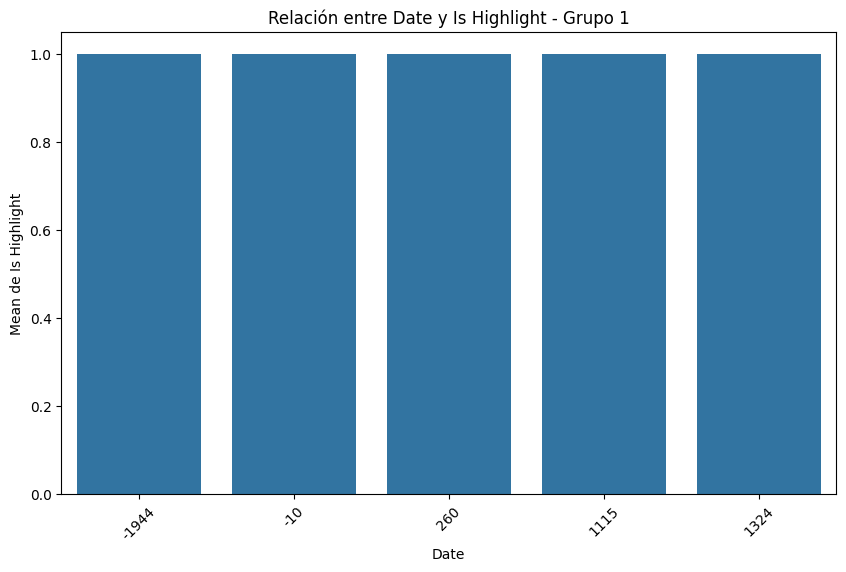

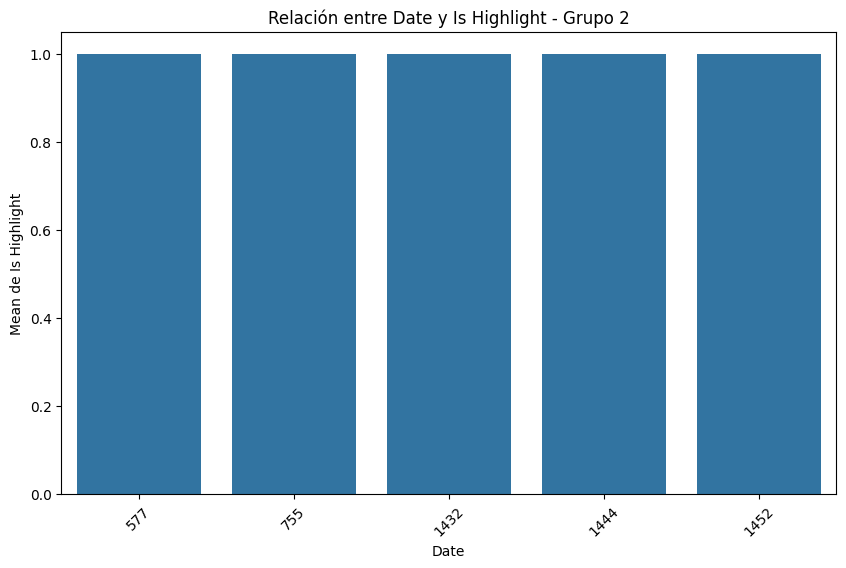

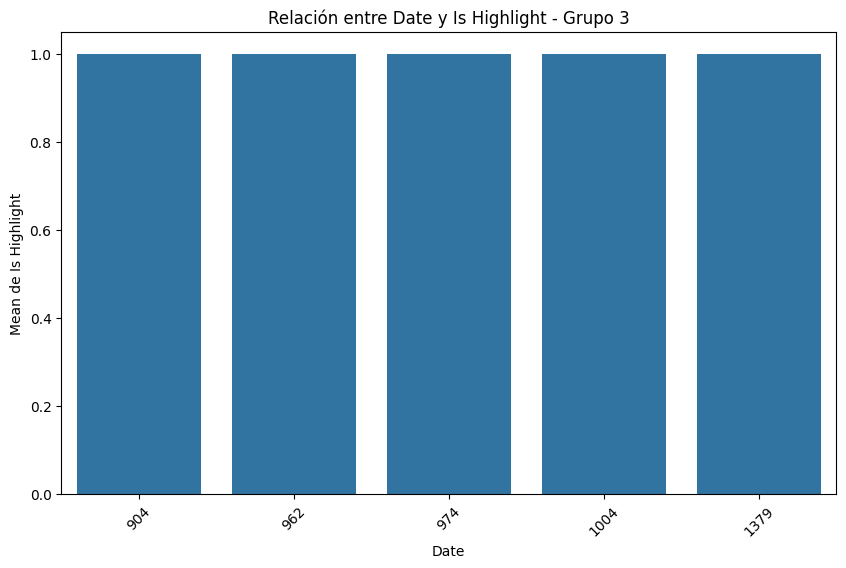

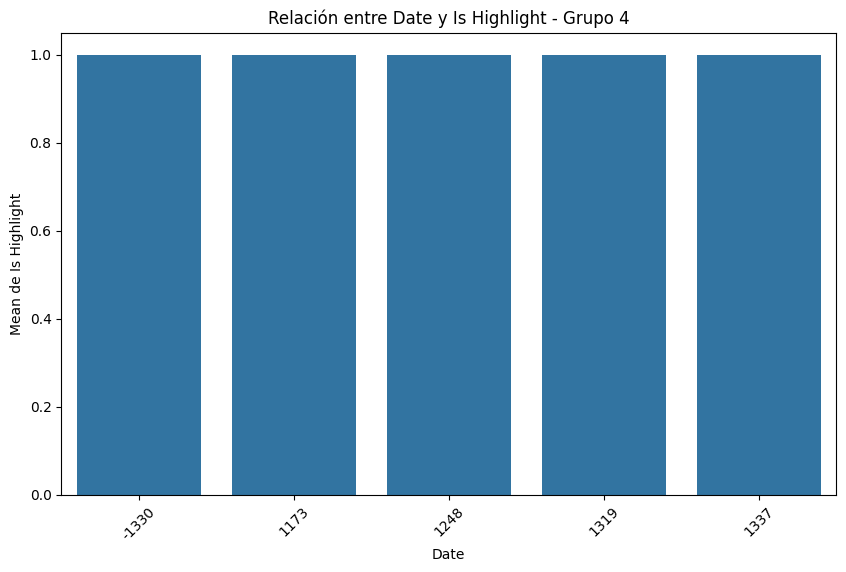

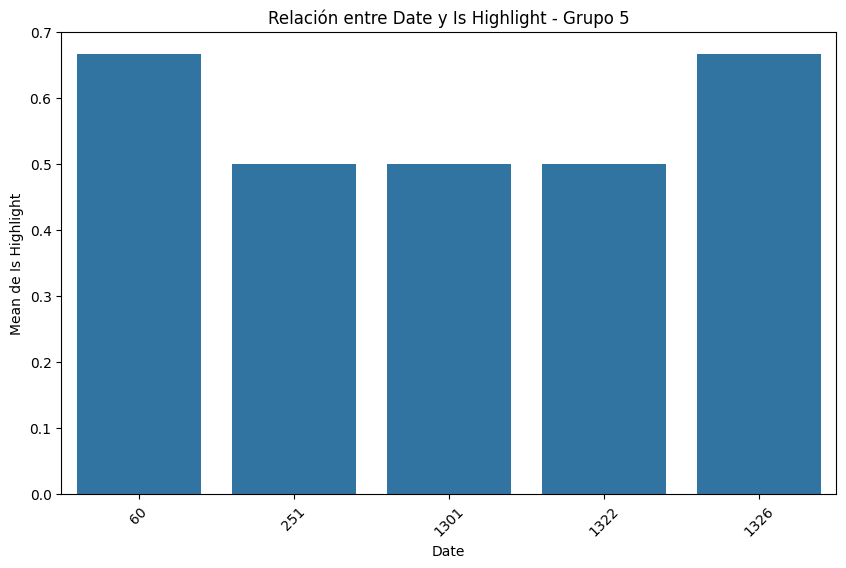

...

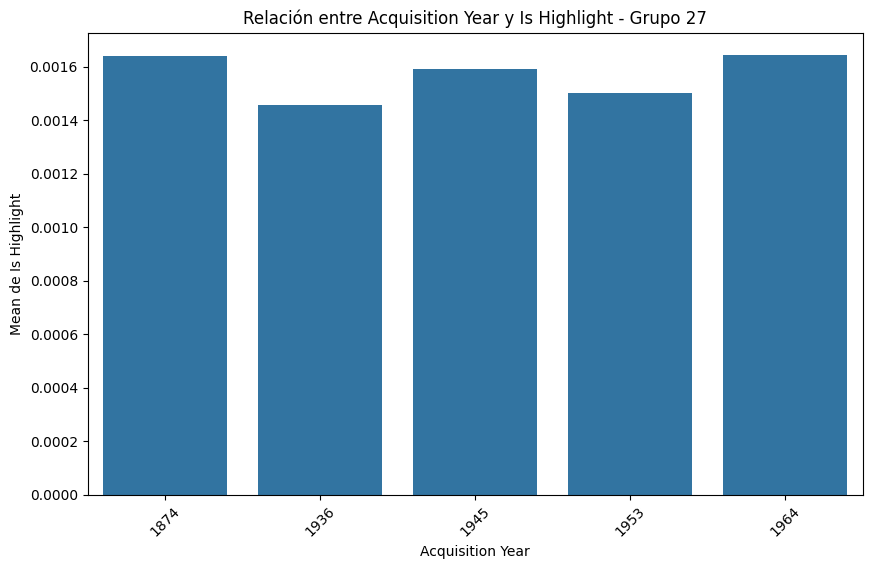

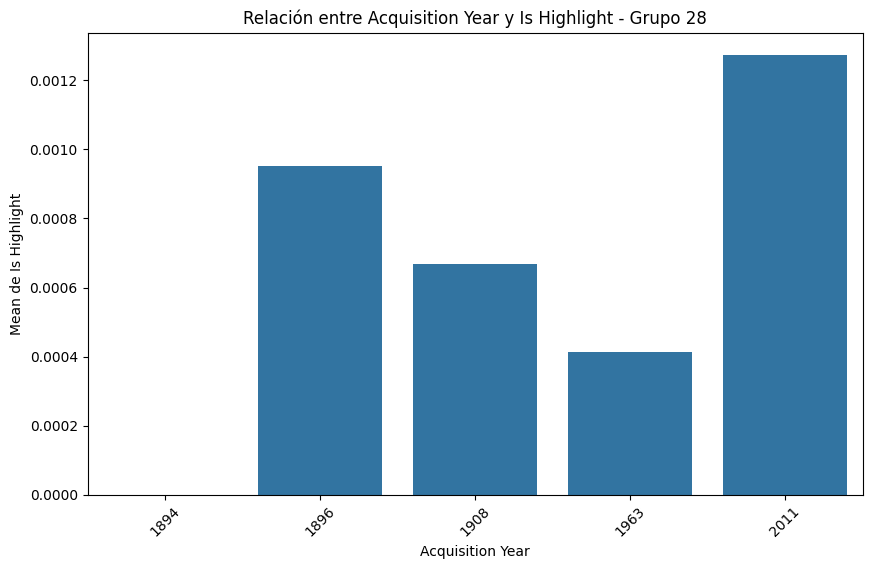

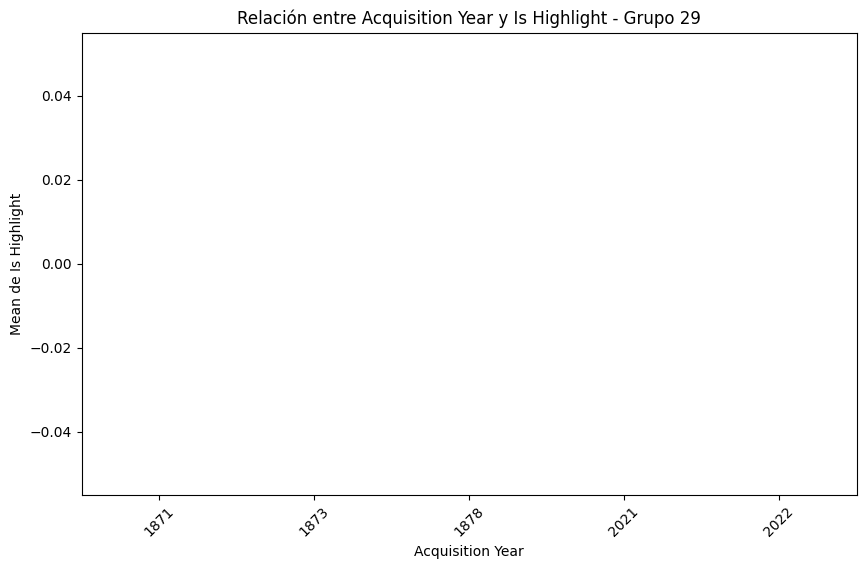

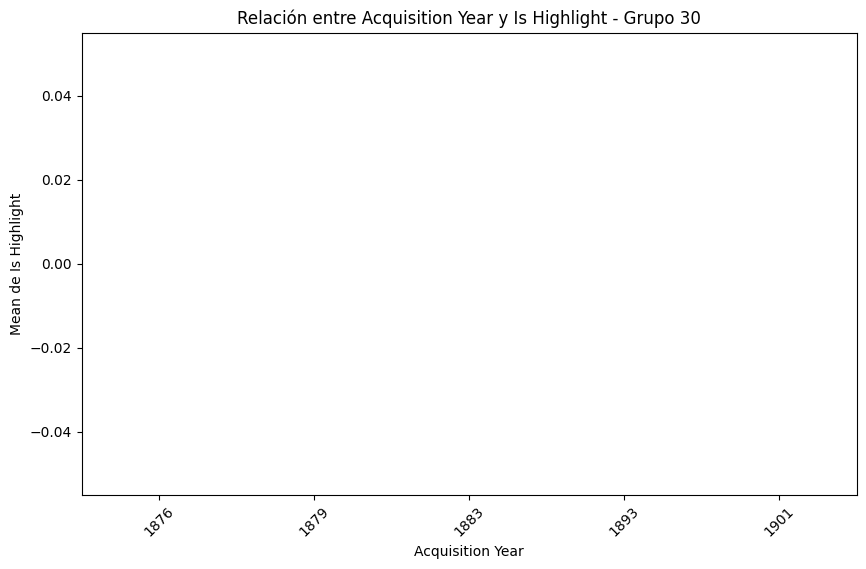

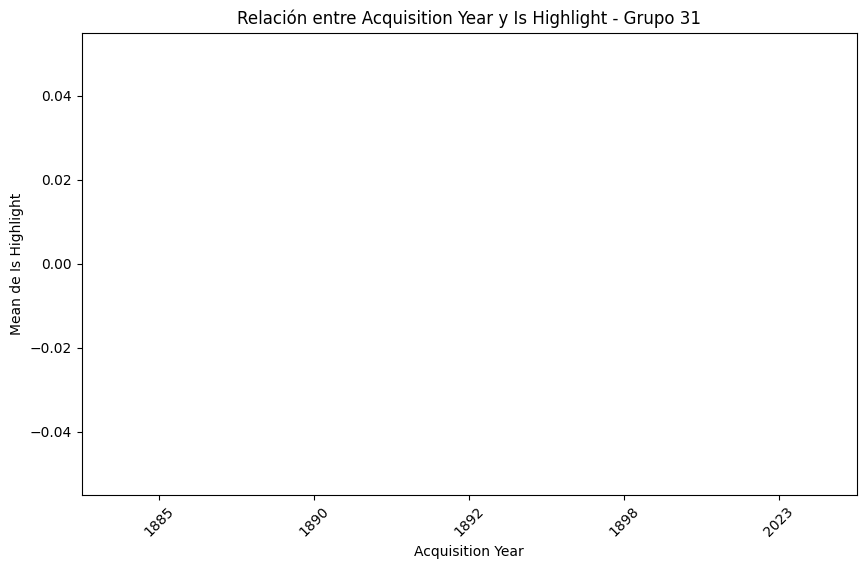

In [11]:
for num_col in num_cols:
    toolbox.plot_categorical_numerical_relationship(train_df, num_col, target)

**Visualización de la correlación**

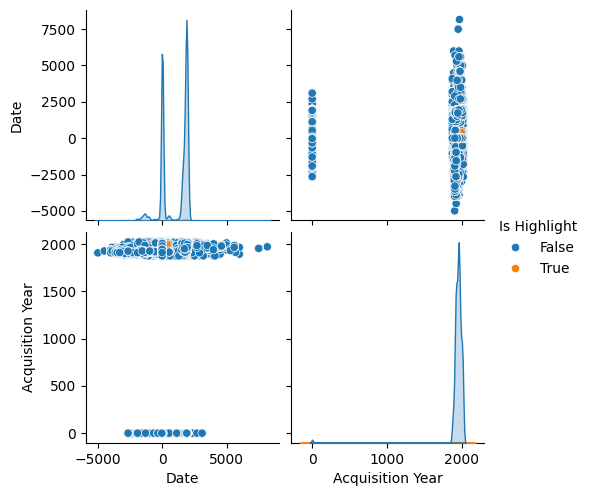

['Date', 'Acquisition Year']

In [12]:
toolbox.plot_num_features_for_classification(train_df, target, num_cols)

Después de este análisis se puede interpretar lo siguiente:  
- Las columnas "Is Highlight", "Is Timeline Work" e "Is Public Domain" son binarias, lo que las hace adecuadas para ser directamente utilizadas como características o como variables objetivo en el modelado. De ahí que "Is Higlight" sea la elegida como el target.  
- Columnas como "Title" y "Dimensions" tienen una gran cantidad de valores únicos y alta cardinalidad, lo que puede hacerlas menos útiles para el modelado debido a su gran variedad y especificidad.
- Las columnas "Artist", "Culture", "Period", "Object Name", "Medium", "Country" y "Credit Line" pueden ser útiles para la categorización y pueden requerir técnicas de codificación como one-hot encoding para su uso en el modelo.  
- Como variables numéricas tenemos las columnas "Date" y "Acquisition Year", que también pueden ser interesantes para el análisis.